In [ ]:
# https://github.com/yingkaisha/keras-unet-collection/blob/main/examples/human-seg_atten-unet-backbone_coco.ipynb

# 🏿 GPU and CUDA

In [2]:
from psutil import virtual_memory       
gpu = !nvidia-smi --query-gpu=gpu_name --format=csv,noheader
ram_gb = virtual_memory().total / 1e9
print(f'{gpu.s} with {round(ram_gb,1)} GB of available RAM.\n')
!nvcc --version

NVIDIA GeForce RTX 3090 with 34.2 GB of available RAM.

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_22:08:44_Pacific_Standard_Time_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0


# ⚙ Configurations

In [3]:
import os
DIR = os.getcwd()
ANN_FILE = os.path.join(DIR, 'data\\result.json')
MSKS_DIR = os.path.join(DIR, 'data\\masks')
IMGS_DIR = os.path.join(DIR, 'data\\images')
NO_LABEL_DIR = os.path.join(DIR, 'output_MSRCR_total')
CHCKPNT_MODELS = os.path.join(DIR, 'checkpoints\\unet')
BATCH_SIZE = 4
IMG_SIZE = (256, 256)
SEED = 1

# Exploratory Data Analysis to COCO format dataset 

In [4]:
# for Windows, install pycocotools with conda
import pycocotools
from pycocotools.coco import COCO
dset = COCO(ANN_FILE)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [5]:
catIDs = dset.getCatIds()
cats = dset.loadCats(catIDs)
print(f"Categories: {cats}")

Categories: [{'id': 0, 'name': 'background'}, {'id': 1, 'name': 'reef'}]


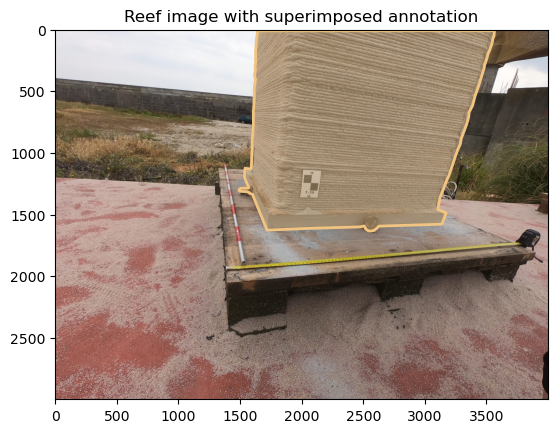

In [7]:
# load and display a random image with the annotation
import skimage.io as io
import numpy as np
import matplotlib.pyplot as plt
imgIds = dset.getImgIds(catIds=[1])
img_info = dset.loadImgs(imgIds[np.random.randint(0,len(imgIds))])[0]
img_dir_reef = os.path.join(IMGS_DIR, '1')
img = io.imread(os.path.join(img_dir_reef, os.path.basename(img_info['file_name'])))
plt.title("Reef image with superimposed annotation")
plt.imshow(img);
annIds = dset.getAnnIds(imgIds=img_info['id'], catIds=1, iscrowd=None)
anns = dset.loadAnns(annIds)
dset.showAnns(anns, draw_bbox=False)

In [ ]:
# generates segmentation mask for reef category
from pathlib import Path
from PIL import Image
from glob import glob
msks_dir = './data/masks'
for i in range(len(glob(IMGS_DIR+"/*.JPG"))):
    img_info = dset.loadImgs(imgIds[i])[0]
    annIds = dset.getAnnIds(imgIds=img_info['id'], catIds=1, iscrowd=None)
    anns = dset.loadAnns(annIds)
    #dset.showAnns(anns, draw_bbox=False)

    mask = np.zeros((img_info['height'],img_info['width']))
    for i in range(len(anns)):
        mask = np.maximum(dset.annToMask(anns[i]), mask)
    # plt.savefig(os.path.join(msks_dir, f'{os.path.basename(img_info['file_name']))}.png))
    basename = Path(os.path.basename(img_info['file_name'])).stem           
    mask_reef = Image.fromarray(mask.astype(np.uint8)*255)
    # stan
    if mask_reef.size != (800, 600):
        mask_reef = mask_reef.resize((800, 600))
    mask_reef.save(os.path.join(MSKS_DIR, basename +'.png'))

# Segmentation Models

In [8]:
import tensorflow as tf
from tensorflow import keras
from keras_unet_collection import models, utils
from keras import backend
backend.set_image_data_format('channels_last')

## (Outros Modelos a testar: DeepLabV3, SegFormer, ++)

In [30]:
# https://keras.io/examples/vision/deeplabv3_plus/
# https://keras.io/examples/vision/segformer/

## U-Net Model *keras-unet-collection*

In [91]:
# https://github.com/yingkaisha/keras-unet-collection/blob/main/keras_unet_collection/_model_unet_2d.py
tf.keras.backend.clear_session()
model = models.unet_2d(input_size = (IMG_SIZE + (3,)), 
                       filter_num = [128, 256, 512, 1024, 2048],  
                       n_labels = 1, 
                       stack_num_down=2, 
                       stack_num_up=2,
                       activation='ReLU', 
                       output_activation='Sigmoid', 
                       batch_norm=False, 
                       pool=True, 
                       unpool=False, # Conv2DTranspose 
                       # backbone = 'VGG19',
                       # weights='imagenet', 
                       # freeze_backbone=False,  
                       freeze_batch_norm=True, 
                       name='unet')

## U-Net Model 

In [ ]:
model.summary()

#### (Funcões de custo alternativas)

In [38]:
from keras_unet_collection import losses

def hybrid_loss(y_true, y_pred):

    loss_focal = losses.focal_tversky(y_true, y_pred, alpha=0.5, gamma=4/3)
    loss_iou = losses.iou_seg(y_true, y_pred)
    
    # (x) 
    #loss_ssim = losses.ms_ssim(y_true, y_pred, max_val=1.0, filter_size=4)
    
    return loss_focal+loss_iou# +loss_ssim

In [50]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.experimental import AdamW
from tensorflow.keras.metrics import Precision         
from tensorflow.keras.metrics import Recall
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.metrics import Accuracy

model.compile(optimizer = AdamW(), 
              loss =  tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),
              metrics= [Accuracy, Precision(thresholds=0.5), Recall(thresholds=0.5), MeanIoU(num_classes=2)]
             )

## Images Data Augmentation

In [51]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
# https://stackoverflow.com/questions/56517963/keras-imagedatagenerator-for-segmentation-with-images-and-masks-in-separate-dire
from keras.preprocessing.image import ImageDataGenerator

img_gen = ImageDataGenerator(rotation_range = 30,
                             shear_range = 0.3,
                             fill_mode='reflect',        # "constant", "nearest", "reflect" or "wrap"
                             horizontal_flip=True, 
                             zoom_range = [0.4, 1],
                             brightness_range=[0.5,1.2],
                             validation_split = 0.15,
                             rescale=1./255)
img_gen_valid = ImageDataGenerator(validation_split = 0.15,
                                   rescale=1./255)

img_trn_dset = img_gen.flow_from_directory(directory = IMGS_DIR,
                                           batch_size = BATCH_SIZE,
                                           target_size = IMG_SIZE,
                                           color_mode="rgb",
                                           class_mode=None,
                                           subset="training",
                                           seed = SEED)

img_vld_dset = img_gen_valid.flow_from_directory(directory = IMGS_DIR,
                                                 batch_size = BATCH_SIZE,
                                                 target_size = IMG_SIZE,
                                                 color_mode="rgb",
                                                 class_mode=None,
                                                 subset="validation",
                                                 seed = SEED)

Found 31 images belonging to 1 classes.
Found 5 images belonging to 1 classes.


### Images Augmentation Sanity Check

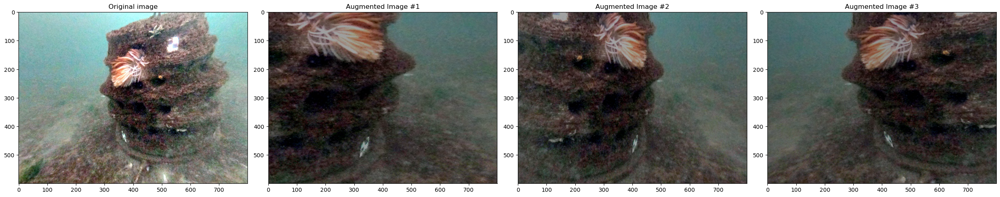

In [58]:
from tensorflow.keras.utils import load_img
# img_info = dset.loadImgs(imgIds[np.random.randint(0,len(imgIds))])[0]
# img_dir_reef = os.path.join(IMGS_DIR, '1')
# img = io.imread(os.path.join(img_dir_reef, os.path.basename(img_info['file_name'])))

img = load_img('data/images/1/810780cb-out_G1906085.JPG')  # this is a PIL image
img_exp = np.expand_dims(img, axis=0)
aug_iter = img_gen.flow(img_exp, batch_size=1, seed = SEED)

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(25,20))

# generate batch of images
ax[0].imshow(img)
ax[0].set_title("Original image")
for i in range(3):
    # convert to unsigned integers
    image = next(aug_iter)[0]
    # plot image
    ax[i+1].set_title(f"Augmented Image #{i+1}")
    ax[i+1].imshow(image)
plt.tight_layout();

## Masks Data Augmentation

In [52]:
msk_gen = ImageDataGenerator(rotation_range = 30,
                             shear_range = 0.3,
                             fill_mode='reflect',        # "constant", "nearest", "reflect" or "wrap"
                             horizontal_flip=True, 
                             zoom_range = [0.5, 1],
                             validation_split = 0.15,
                             rescale=1./255)

msk_gen_valid = ImageDataGenerator(validation_split = 0.15,
                                   rescale=1./255)

msk_trn_dset = msk_gen.flow_from_directory(directory = MSKS_DIR,
                                           batch_size = BATCH_SIZE,
                                           target_size = IMG_SIZE,
                                           color_mode="grayscale",
                                           class_mode=None,
                                           subset="training",
                                           seed = SEED)

msk_vld_dset = msk_gen_valid.flow_from_directory(directory = MSKS_DIR,
                                                 batch_size = BATCH_SIZE,
                                                 target_size = IMG_SIZE,
                                                 color_mode="grayscale",
                                                 class_mode=None,
                                                 subset="validation",
                                                 seed = SEED)

Found 31 images belonging to 1 classes.
Found 5 images belonging to 1 classes.


### Masks Augmentation Sanity Check

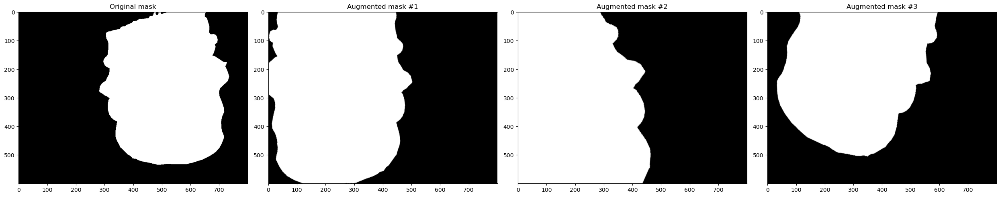

In [23]:
msk = load_img('data/masks/1/810780cb-out_G1906085.png')  # this is a PIL image
img_exp = np.expand_dims(msk, axis=0)
aug_iter = msk_gen.flow(img_exp, batch_size=1, seed = SEED)

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(25,20))

# generate batch of images
ax[0].imshow(msk)
ax[0].set_title("Original mask")
for i in range(3):
    # convert to unsigned integers
    image = next(aug_iter)[0]
    # plot image
    ax[i+1].set_title(f"Augmented mask #{i+1}")
    ax[i+1].imshow(image)
plt.tight_layout();

# Corrigir => Criar função para binarizar mascara

In [66]:
np.unique(image)

array([0.0000000e+00, 3.0038244e-04, 6.4497621e-04, ..., 9.9872738e-01,
       9.9899542e-01, 1.0000000e+00], dtype=float32)

In [ ]:
# def funcs_callback(str_run):
#     """
    
#     """
#     # ~~~ Aprendizagem com Cronograma ~~~~~
#     #  Reducao em Plateau
#     reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
#         monitor = 'loss',
#         factor = 0.5,    # fator de reducao tx. aprendizagem
#         mode = 'min',    # tx. apr. diminui se IoU nao aumentar
#         patience = 10,   # epocas ate reducao tx. aprendizagem
#         verbose = 1,     # verbosidade
#         min_lr = 1e-6)   # tx.aprendizagem inicial = 0.1
#     # ~~~ Logs do Treino ~~~~~~~~~~~~~~~~~~
#     csv_logger = tf.keras.callbacks.CSVLogger(
#         os.path.join(LOGS_MODELOS, str_run + '.csv'),
#         separator=",",
#         append = True)

#     # ~~ ModelCheckPoint ~~~~~~~~~~~~~~~~~~
#     # callback para guardar melhor modelo ao fim de cada época se custo for inferior
#     loss_cb = tf.keras.callbacks.ModelCheckpoint(
#         filepath = os.path.join(CHECKPOINT_MODELOS, str_run + '.h5'),
#         save_best_only = True,
#         mode = 'max',
#         verbose = 1, 
#         monitor = "iou")

#     callbacks = [reduce_lr]
    
#     return callbacks

# Fitting Model

In [53]:
def string_run(model_name = 'NET', fold = [], val_cruz = False):
    """
    Creates a string for the run.
    """
    from datetime import datetime
    now = datetime.now()
    dt_string = now.strftime("%d_%b_%Hh%Mmin")
    str_run = f"{model_name}_DT_{dt_string}"
    if val_cruz == True:
        str_run = str_run + "_fold_" + str(fold)
    print(f'run designation: \033[1m{str_run}\033[0m')
    return str_run

In [55]:
train_generator = zip(img_trn_dset, msk_trn_dset)
valid_generator = zip(img_vld_dset, msk_vld_dset)

## Learning Rate Finder

https://github.com/benihime91/one_cycle_lr-tensorflow

In [43]:
# Import LrFinder
from lr_find import LrFinder

# Instantiate Optimizer & loss_fn 
optimizer = tf.keras.optimizers.Adam()
loss_fn = tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1)
#loss_fn = hybrid_loss

# Instantiate LrFinder
lr_find = LrFinder(model, optimizer, hybrid_loss)

# Start range_test
lr_find.range_test(train_generator, end_lr=100, num_iter=100)

Finding best initial lr over 100 steps


  0%|          | 0/100 [00:00<?, ?it/s]

LR Finder is complete, type {LrFinder}.plot_lrs() to see the graph.


Min numerical gradient: 2.69E-05
Min loss divided by 10: 9.33E-06


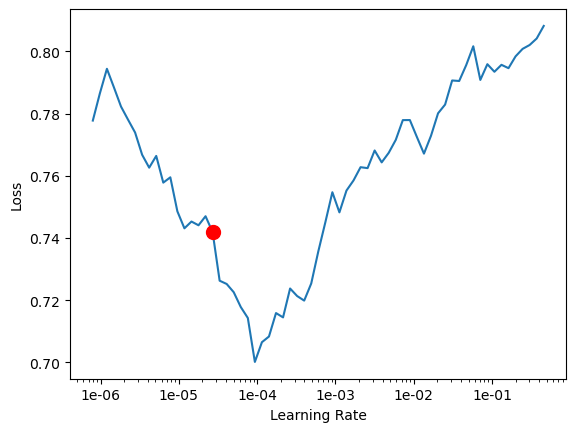

In [44]:
lr_find.plot_lrs(skip_end=0, suggestion=True)

In [79]:
#reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor = 'loss',
#                                              factor = 0.5,    # fator de reducao tx. aprendizagem
#                                              mode = 'min',    # tx. apr. diminui se IoU nao aumentar
#                                              patience = 20,   # epocas ate reducao tx. aprendizagem
#                                              verbose = 1,     # verbosidade
#                                              min_lr = 1e-6)   # tx.aprendizagem inicial = 0.1

chckpnt_cb = keras.callbacks.ModelCheckpoint(filepath = os.path.join(CHCKPNT_MODELS, str_run + '.h5'),
                                             save_best_only = True,
                                             mode = 'max',
                                             verbose = 1, 
                                             monitor = "val_accuracy")

# Creates string for saving and identifying model
str_run = string_run(model_name = 'unet')

run designation: unet_DT_13_Mar_09h22min


In [82]:
from one_cycle import OneCycleLr

max_lr = 2.69e-05
one_c = OneCycleLr(max_lr=max_lr, steps_per_epoch=(img_trn_dset.n // BATCH_SIZE)*5, epochs=500)

In [84]:
%%time
# 🏋🏽 trains the model
history = model.fit(train_generator,
                    validation_data = valid_generator,
                    epochs = 500,
                    batch_size = BATCH_SIZE,
                    verbose = 1,
                    steps_per_epoch = (img_trn_dset.n // BATCH_SIZE)*10,
                    validation_steps = img_vld_dset.n // BATCH_SIZE,
                    validation_batch_size = BATCH_SIZE,
                    callbacks = [chckpnt_cb, one_c])

Epoch 1/500
70/70 [==============================] - ETA: 0s - loss: 0.4402 - accuracy: 0.7685 - precision_2: 0.7944 - recall_2: 0.7986
Epoch 1: val_accuracy improved from -inf to 0.93278, saving model to C:\Users\tiago\miniconda3\envs\tf2_10\reefs\checkpoints\unet\unet_DT_11_Mar_14h57min.h5
70/70 [==============================] - 24s 312ms/step - loss: 0.4402 - accuracy: 0.7685 - precision_2: 0.7944 - recall_2: 0.7986 - val_loss: 0.2658 - val_accuracy: 0.9328 - val_precision_2: 0.9143 - val_recall_2: 0.9674
Epoch 2/500
70/70 [==============================] - ETA: 0s - loss: 0.4327 - accuracy: 0.7745 - precision_2: 0.7937 - recall_2: 0.8117
Epoch 2: val_accuracy did not improve from 0.93278
70/70 [==============================] - 19s 274ms/step - loss: 0.4327 - accuracy: 0.7745 - precision_2: 0.7937 - recall_2: 0.8117 - val_loss: 0.2647 - val_accuracy: 0.9309 - val_precision_2: 0.9138 - val_recall_2: 0.9643
Epoch 3/500
70/70 [==============================] - ETA: 0s - loss: 0.4317 

## End Training

In [27]:
def graficos_metricas(history, model, conf_modelo, iou = False, y_log = False):
    """

    """
    plt.style.use('fast') 

    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,8))

    if iou == True:
        # Cria Gráfico de Intersecão sobre a União (IoU) ou distância de Jaccard 
        ax1.plot(np.array(history.history['iou_score'])*100,"limegreen",  marker =".")
        ax1.plot(np.array(history.history['val_iou_score'])*100, "orangered" ,  marker =".")
        ax1.set_title('Indíce de Jaccard (IoU) do ' + model.name + '\n'+ "Configuracão: "+ conf_modelo)
        ax1.set_ylabel('Indíce de Jaccard (%)')
        ax1.set_xlabel('Época')
        ax1.legend(['treino', 'validacão'], loc = 'best')
        ax1.grid(linestyle = '--', linewidth = 0.4)

        # Cria caixa indicando o máximo de acurácia de validacão
        # (objetivo: criar nota com valor relevante dentro do espaco do gráfico)
        xmax = np.argmax(history.history['val_iou_score'])
        ymax = max(history.history['val_iou_score'])*100
        text= "IoU. Val.:{:.3f} %".format(ymax)
        # lw, linewidth; fc, facebolor; ec, edgecolor
        bbox_props = dict(boxstyle="round,pad=0.3", fc="w", ec="k", lw=0.5)   
        arrowprops1 = dict(arrowstyle="->",connectionstyle="arc3,rad=0.3")
        kw = dict(xycoords='data',textcoords="offset points",
                  arrowprops=arrowprops1, bbox=bbox_props, ha="right", va="center")
        ax1.annotate(text, xy=(xmax, ymax), xytext=(-15,-30), **kw)
        ax1.set_ylim(top = max(history.history['val_iou_score'] + 
                                history.history['iou_score'])*100 + 1)
    else:
        # Cria Gráfico de Acurácia
        ax1.plot(np.array(history.history['accuracy'])*100,"limegreen",  marker =".")
        ax1.plot(np.array(history.history['val_accuracy'])*100, "orangered" ,  marker =".")
        ax1.set_title('Acurácia do ' + model.name + '\n'+ "Configuracão: "+ conf_modelo)
        ax1.set_ylabel('Acurácia (%)')
        ax1.set_xlabel('Época')
        ax1.legend(['treino', 'validacão'], loc = 'best')
        ax1.grid(linestyle = '--', linewidth = 0.4)

        # Cria caixa indicando o máximo de acurácia de validacão
        # (objetivo: criar nota com valor relevante dentro do espaco do gráfico)
        xmax = np.argmax(history.history['val_accuracy'])
        ymax = max(history.history['val_accuracy'])*100
        text= "Acur. Val.:{:.3f} %".format(ymax)
        # lw, linewidth; fc, facebolor; ec, edgecolor
        bbox_props = dict(boxstyle="round,pad=0.3", fc="w", ec="k", lw=0.5)   
        arrowprops1 = dict(arrowstyle="->",connectionstyle="arc3,rad=0.3")
        kw = dict(xycoords='data',textcoords="offset points",
                  arrowprops=arrowprops1, bbox=bbox_props, ha="right", va="center")
        ax1.annotate(text, xy=(xmax, ymax), xytext=(-15,-30), **kw)
        ax1.set_ylim(top = max(history.history['val_accuracy'] + 
                               history.history['accuracy'])*100 + 1)
  
    # Cria Gráfico de Custo
    ax2.plot(history.history['loss'], "limegreen",  marker =".")
    ax2.plot(history.history['val_loss'],"orangered" ,  marker =".")
    ax2.set_title('Custo do '+ model.name +'\n'+ "Configuracão: "+ conf_modelo)
    ax2.set_ylabel('Custo')
    ax2.set_xlabel('Época')
    ax2.legend(['treino', 'validacão'], loc = 'best')
    ax2.grid(linestyle = '--', linewidth = 0.5)
    ax2.set_ylim(ymin=0)
    if y_log == True:
        ax2.set_yscale('log')
        ax2.set_ylim(None)
        
    # Cria caixa indicando o minímo de custo de validacão
    xmin = np.argmin(history.history['val_loss'])
    ymin = min(history.history['val_loss'])
    text2= "Custo. Val.:{:.3f}".format(ymin)
    bbox_props2 = dict(boxstyle="round,pad=0.3", fc="w", ec="k", lw = 0.5)
    arrowprops2 = dict(arrowstyle="->",connectionstyle="arc3,rad=-0.3")
    kw2 = dict(xycoords='data',textcoords="offset points",
               arrowprops=arrowprops2, bbox=bbox_props2, ha="right", va="center")
    ax2.annotate(text2, xy=(xmin, ymin), xytext=(70, 35), **kw2)
    plt.tight_layout()

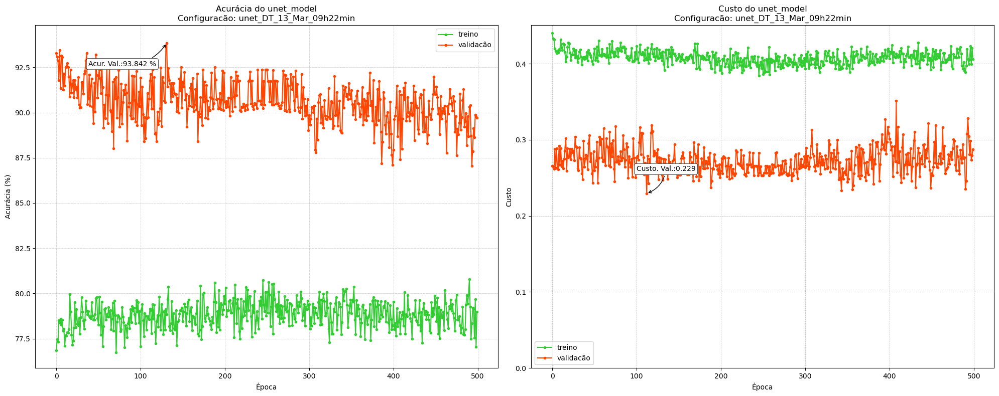

In [85]:
# onecycle, 500 ep, 10*step
graficos_metricas(history, model, conf_modelo = str_run, iou = False, y_log = False)

unet_DT_13_Mar_09h22min


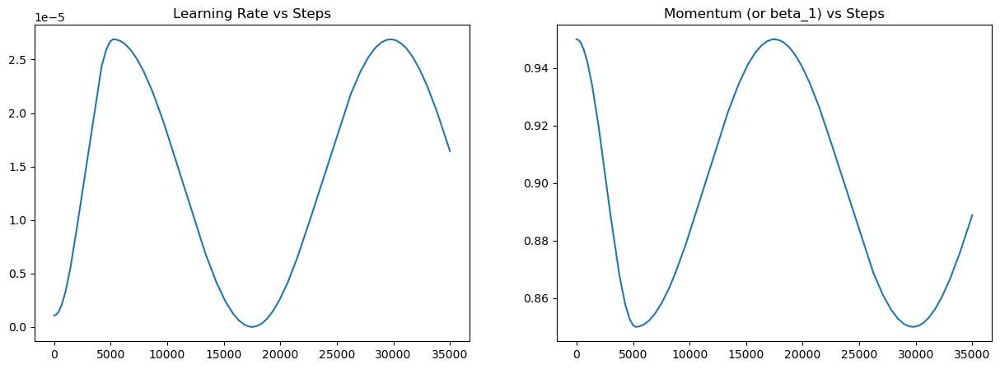

In [86]:
# to plot the learning_rate & momentum(or beta_1) graphs
print(str_run)
one_c.plot_lrs_moms()

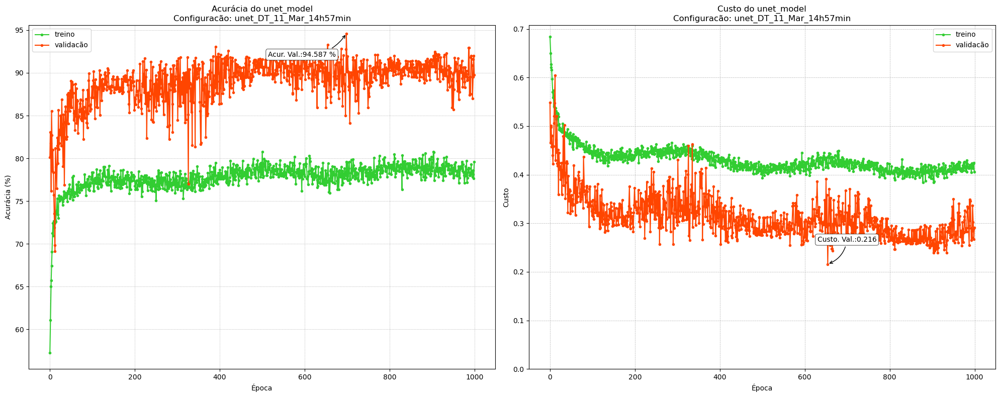

In [57]:
# onecycle, 1000 ep, 10*step
graficos_metricas(history, model, conf_modelo = str_run, iou = False, y_log = False)

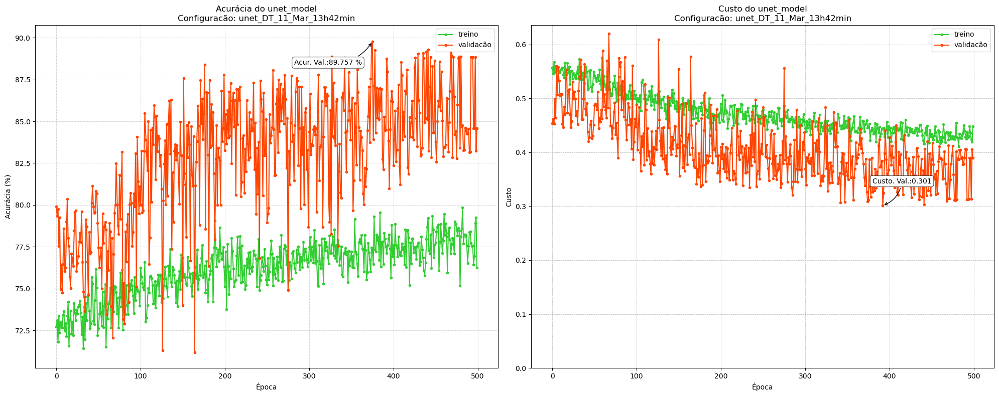

In [47]:
# hibrid loss, onecycle
graficos_metricas(history, model, conf_modelo = str_run, iou = False, y_log = False)

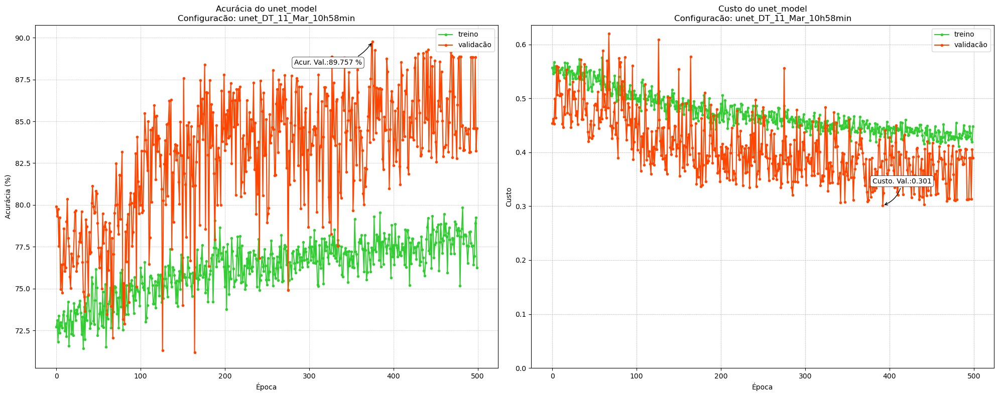

In [28]:
graficos_metricas(history, model, conf_modelo = str_run, iou = False, y_log = False)

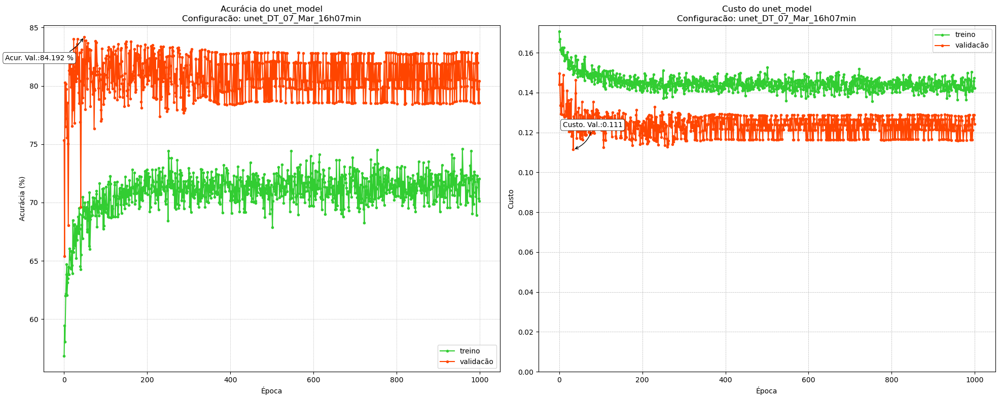

In [16]:
graficos_metricas(history, model, conf_modelo = str_run, iou = False, y_log = False)

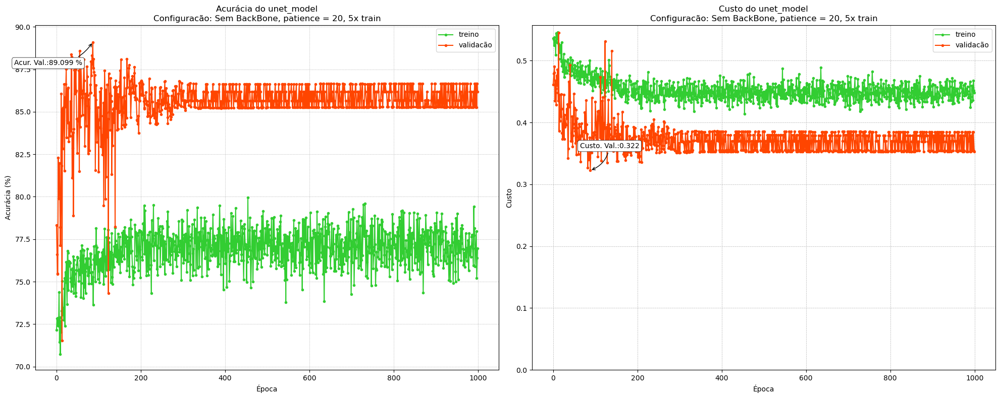

In [33]:
graficos_metricas(history, model, conf_modelo = "Sem BackBone, patience = 20, 5x train", iou = False, y_log = False)

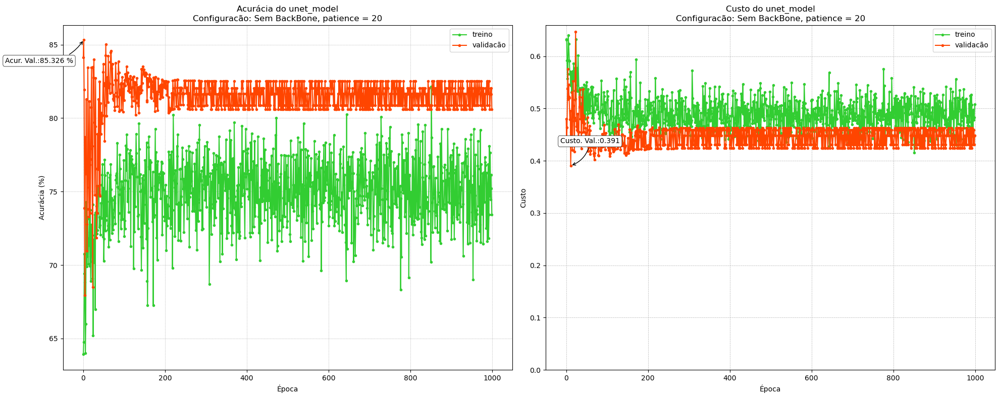

In [69]:
graficos_metricas(history, model, conf_modelo = "Sem BackBone, patience = 20", iou = False, y_log = False)

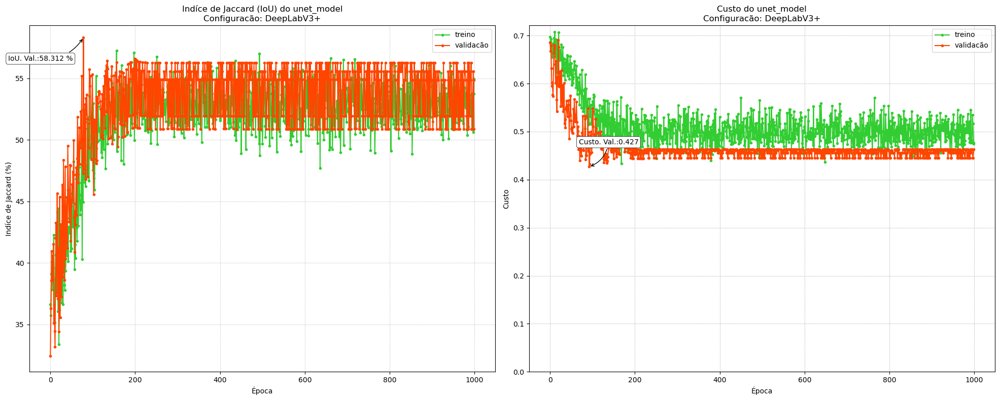

In [62]:
graficos_metricas(history, model, conf_modelo = "Sem BackBone", iou = True, y_log = False)

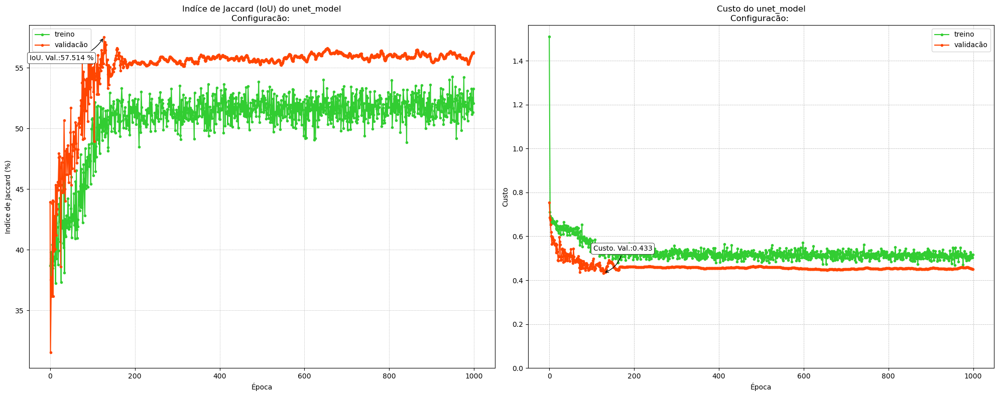

In [ ]:
graficos_metricas(history, model, conf_modelo = "", iou = True, y_log = False)

# Inference

In [ ]:
model = keras.models.load_model(CHCKPNT_MODELS + '\\'+str_run+'.h5')

1/1 [==============================] - 0s 17ms/step


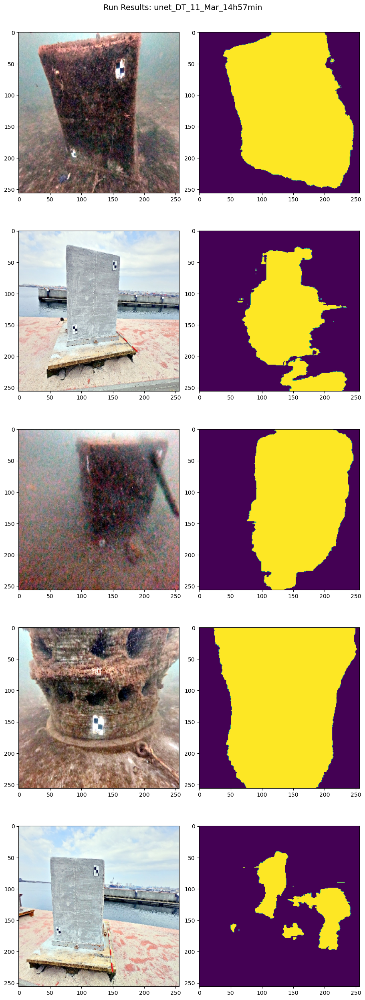

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from glob import glob


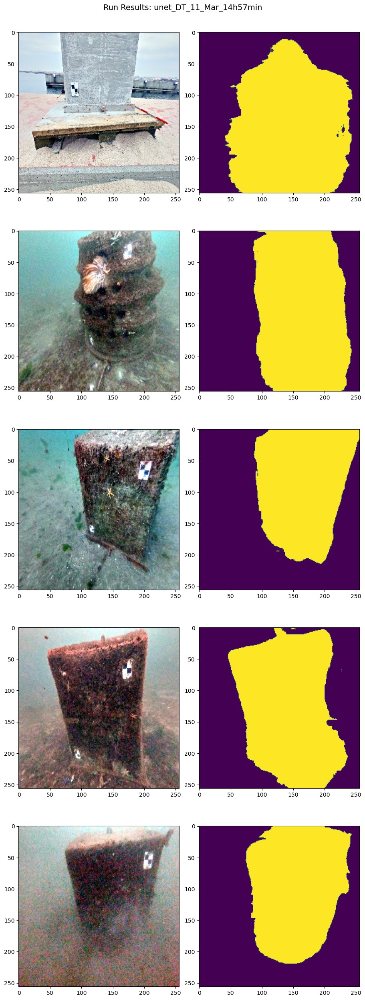

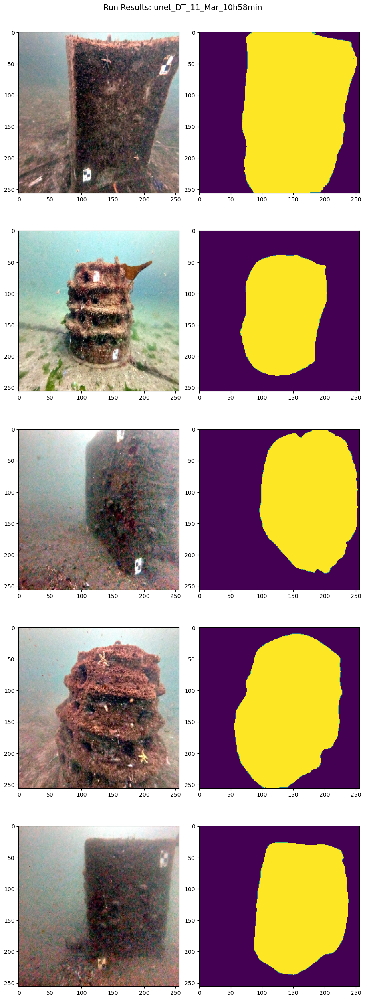

In [37]:
fig, axs = plt.subplots(5, 3, figsize=(9,25), constrained_layout=True)
j = 0
for img, pred in zip(img_list, pred_list):
    axs[j, 0].imshow(np.asarray(img).astype("int"))
    axs[j, 1].imshow(np.asarray(pred).astype("int"))
    axs[j, 2].imshow(np.asarray(pred).astype("int"))
    j += 1
plt.suptitle('Run Results: '+ str_run, fontsize=14);
plt.tight_layout;

**TODO LIST**

0. Testar sem BackBone e minha U-Net - done
1. Converter os resto das imagens e plotar segmentações - falta plotar
2. Testar outros modelos - De
3. Anotar conjunto de teste 
(4. Considerar patchification)

In [ ]:
from IPython.display import clear_output

def create_mask(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=1)
    pred_mask = tf.expand_dims(pred_mask, -1)
    return pred_mask[0]

def show_predictions(dataset=None, num=1):
    if dataset:
        for sample in dataset.take(num):
            images, masks = sample["pixel_values"], sample["labels"]
            masks = tf.expand_dims(masks, -1)
            pred_masks = model.predict(images).logits
            images = tf.transpose(images, (0, 2, 3, 1))
            display([images[0], masks[0], create_mask(pred_masks)])
    else:
        display(
            [
                sample_image,
                sample_mask,
                create_mask(model.predict(tf.expand_dims(sample_image, 0))),
            ]
        )

class DisplayCallback(tf.keras.callbacks.Callback):
    def __init__(self, dataset, **kwargs):
        super().__init__(**kwargs)
        self.dataset = dataset

    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        show_predictions(self.dataset)
        print("\nSample Prediction after epoch {}\n".format(epoch + 1))

In [70]:
def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions